# I. Importing Modules

In [635]:
#Importing modules-packages
import os
import numpy as np
import pandas as pd
import graphviz
import matplotlib.pyplot as plt
from collections import Counter
from sklearn import tree
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.externals.six import StringIO
from sklearn.tree import export_graphviz
from sklearn.metrics import recall_score
from IPython.display import Image
import pydotplus
from google.colab import drive
from sklearn.metrics import precision_score
from sklearn.metrics import confusion_matrix
from IPython.display import Image
from google.colab import drive


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from collections import Counter
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.externals.six import StringIO
from sklearn.metrics import confusion_matrix
from sklearn.tree import export_graphviz
from sklearn import tree
from IPython.display import Image
from google.colab import drive

# II. Mounting Google Drive

In [636]:
#Mounting google drive to link the working directories
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# III. Linking Working Directories

In [637]:
#Linking google drive data folder
census = "/content/drive/MyDrive/MSBA_Colab_2020/ML_Algorithms/CA03/Data/census_data.csv"

# IV. Reading the CSV file

In [638]:
#Reading the csv file linked to the directory
census = pd.read_csv(census)

# V. Data Inspection and Quality Analysis

In [639]:
# Descriptive statistics and first few rows
census.describe()
census.head()

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
0,b. 31-40,b. Mid - Low,b. Mid,c. > 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,train,0
1,a. 0-30,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,0
2,b. 31-40,a. Low,b. Mid,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,0
3,b. 31-40,a. Low,c. High,a. = 0,b. Mid,a. 0-8,a. Low,b. income,e. 40-55,train,0
4,b. 31-40,e. High,c. High,a. = 0,a. Low,c. 13,c. Bachelors,b. income,b. 26-30 & 71-100,train,0


In [640]:
#Count of Rows
census.count()

hours_per_week_bin    48842
occupation_bin        48842
msr_bin               48842
capital_gl_bin        48842
race_sex_bin          48842
education_num_bin     48842
education_bin         48842
workclass_bin         48842
age_bin               48842
flag                  48842
y                     48842
dtype: int64

In [641]:
# Data type
census.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   hours_per_week_bin  48842 non-null  object
 1   occupation_bin      48842 non-null  object
 2   msr_bin             48842 non-null  object
 3   capital_gl_bin      48842 non-null  object
 4   race_sex_bin        48842 non-null  object
 5   education_num_bin   48842 non-null  object
 6   education_bin       48842 non-null  object
 7   workclass_bin       48842 non-null  object
 8   age_bin             48842 non-null  object
 9   flag                48842 non-null  object
 10  y                   48842 non-null  int64 
dtypes: int64(1), object(10)
memory usage: 4.1+ MB


In [642]:
# Check for duplicate records:
census.duplicated().sum()

40012

In [643]:
#Cheking for Null Values
pd.isnull(census).sum()

hours_per_week_bin    0
occupation_bin        0
msr_bin               0
capital_gl_bin        0
race_sex_bin          0
education_num_bin     0
education_bin         0
workclass_bin         0
age_bin               0
flag                  0
y                     0
dtype: int64

Descriptive Statistics For Each Column

In [644]:
#Descriptive Statistics for #hours_per_week_bin
census.hours_per_week_bin.sort_index().value_counts()
## 31-40 = 26639, 41-50 & 61-70 = 9819, 0-30 = 7851, 51-60 = 3759, 71-100 = 774 are the outputs

#mode
census.hours_per_week_bin.mode()
##31-40 is the output

#min
census.hours_per_week_bin.min()
##0-30 is the output

#max
census.hours_per_week_bin.max()
##51-60 is the output

'e. 51-60'

In [645]:
#Descriptive Statistics for #occupation_bin
census.occupation_bin.sort_index().value_counts()
## Mid - Mid = 13971, Mid - Low = 12947, High = 12258, Low = 7237, Mid - High = 2429 are the outputs

#mode
census.occupation_bin.mode()
##31-40 is the output

#min
census.occupation_bin.min()
##0-30 is the output

#max
census.occupation_bin.max()
##51-60 is the output

'e. High'

In [646]:
#Descriptive Statistics for #msr_bin
census.msr_bin.sort_index().value_counts()
## High = 22047, Mid = 15868, Low = 10927 are the outputs

#mode
census.msr_bin.mode()
##High is the output

#min
census.msr_bin.min()
##Low is the output

#max
census.msr_bin.max()
##High is the output

'c. High'

In [647]:
#Descriptive Statistics for #capital_gl_bin
census.capital_gl_bin.sort_index().value_counts()
## = 0 is 42525, > 0 is 4035, < 0 is 2282; are the outputs

#mode
census.capital_gl_bin.mode()
## = 0 is the output

#min
census.capital_gl_bin.min()
## = 0 is the output

#max
census.capital_gl_bin.max()
## > 0 is the output

'c. > 0'

In [648]:
#Descriptive Statistics for #race_sex_bin
census.race_sex_bin.sort_index().value_counts()
## High = 29739, Mid = 16457, Low = 2648; are the outputs

#mode
census.race_sex_bin.mode()
## High is the output

#min
census.race_sex_bin.min()
## Low is the output

#max
census.race_sex_bin.max()
## High is the output

'c. High'

In [649]:
#Descriptive Statistics for #education_num_bin
census.education_num_bin.sort_index().value_counts()
## 9-12 = 30324, 13 = 8025, 0-8 = 6408, 14 = 2657, 15+ = 1428; are the outputs

#mode
census.education_num_bin.mode()
## 9-12 is the output

#min
census.education_num_bin.min()
## 0-8 is the output

#max
census.education_num_bin.max()
## 15+ is the output

'e. 15+'

In [650]:
#Descriptive Statistics for #education_bin
census.education_bin.sort_index().value_counts()
## 9-12 = 30324, 13 = 8025, 0-8 = 6408, 14 = 2657, 15+ = 1428; are the outputs

#mode
census.education_bin.mode()
## Mid is the output

#min
census.education_bin.min()
## Low is the output

#max
census.education_bin.max()
## High is the output

'e. High'

In [651]:
#Descriptive Statistics for #workclass_bin
census.workclass_bin.sort_index().value_counts()
## income = 46012, no income = 2830; are the outputs

#mode
census.workclass_bin.mode()
## income is the output

#min
census.workclass_bin.min()
## no income is the output

#max
census.workclass_bin.max()
## income is the output

'b. income'

In [652]:
#Descriptive Statistics for #age_bin
census.age_bin.sort_index().value_counts()
## 40-55 is 13963, 0-25 = 9627,31-35 & 61-70 = 9291, 36-40 & 56-60 = 8927, 26-30 & 71-100 = 7024; are the outputs

#mode
census.age_bin.mode()
## 40-55 is the output

#min
census.age_bin.min()
## 0-25 is the output

#max
census.age_bin.max()
## 40-55 is the output

'e. 40-55'

In [653]:
#Descriptive Statistics for #flag
census.flag.sort_index().value_counts()
## train = 32361, test = 16281; are the outputs

#mode
census.flag.mode()
## train is the output

#min
census.flag.min()
## test is the output

#max
census.flag.max()
## 4train is the output

'train'

In [654]:
#Descriptive Statistics for #y
census.y.sort_index().value_counts()
## 0 = 37155, 1 = 11687; are the outputs

#mode
census.y.mode()
## 0 is the output

#min
census.y.min()
## 0 is the output

#max
census.y.max()
## 1 is the output

1

# VI. Exploratory Data Analysis

In [655]:
#Exploratory Data Analysis of the income groups with respect to explanatory variables along with the graphical representations
#Segregation of census flag 1 and 0 for stacking
census_0 = census.loc[census.y == 0]
census_1 = census.loc[census.y == 1]

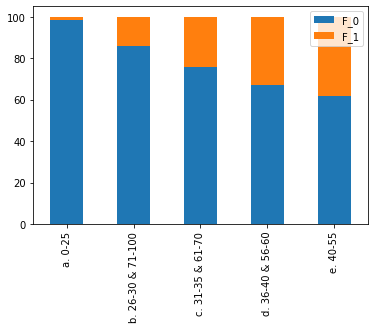

In [656]:
#Age
#Counter Collection Data into list
Counter(census_0.age_bin.tolist())
Counter(census_1.age_bin.tolist())
#Storing the Age lists into Dictionaries
age1_dict = dict(Counter(census_1.age_bin.tolist()))
age0_dict = dict(Counter(census_0.age_bin.tolist()))
#Creating Age DataFrame
age_df = pd.DataFrame({"0":pd.Series(age0_dict),"1":pd.Series(age1_dict)})
age_df["Total"] = age_df["0"]+age_df["1"]
age_df["F_0"] = age_df["0"]/age_df["Total"]*100
age_df["F_1"] = age_df["1"]/age_df["Total"]*100
#Stacked Bar Graph
age_percent = age_df[["F_0", "F_1"]]
age_percent.plot(kind = "bar",stacked = True)
plt.show()

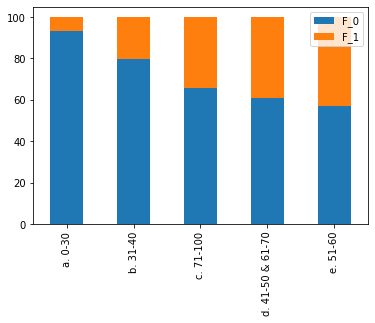

In [657]:
#Hours Per Week
#Counter Collection Data into list
Counter(census_0.hours_per_week_bin.tolist())
Counter(census_1.hours_per_week_bin.tolist())
#Storing the hours_per_week lists into Dictionaries
hpw1_dict = dict(Counter(census_1.hours_per_week_bin.tolist()))
hpw0_dict = dict(Counter(census_0.hours_per_week_bin.tolist()))
#Creating hours_per_week DataFrame
hpw_df = pd.DataFrame({"0":pd.Series(hpw0_dict),"1":pd.Series(hpw1_dict)})
hpw_df["Total"] = hpw_df["0"]+hpw_df["1"]
hpw_df["F_0"] = hpw_df["0"]/hpw_df["Total"]*100
hpw_df["F_1"] = hpw_df["1"]/hpw_df["Total"]*100
#Stacked Bar Graph
hpw_percent = hpw_df[["F_0", "F_1"]]
hpw_percent.plot(kind = "bar",stacked = True)
plt.show()

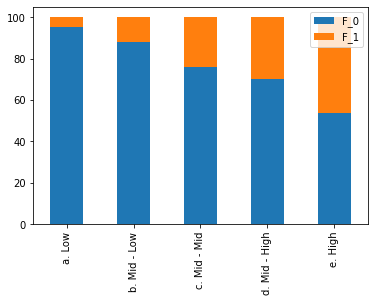

In [658]:
#Occupation
#Counter Collection Data into list
Counter(census_0.occupation_bin.tolist())
Counter(census_1.occupation_bin.tolist())
#Storing the occupation_bin lists into Dictionaries
occupation1_dict = dict(Counter(census_1.occupation_bin.tolist()))
occupation0_dict = dict(Counter(census_0.occupation_bin.tolist()))
#Creating Occupation DataFrame
occupation_df = pd.DataFrame({"0":pd.Series(occupation0_dict),"1":pd.Series(occupation1_dict)})
occupation_df["Total"] = occupation_df["0"]+occupation_df["1"]
occupation_df["F_0"] = occupation_df["0"]/occupation_df["Total"]*100
occupation_df["F_1"] = occupation_df["1"]/occupation_df["Total"]*100
#Stacked Bar Graph
occupation_percent = occupation_df[["F_0", "F_1"]]
occupation_percent.plot(kind = "bar",stacked = True)
plt.show()

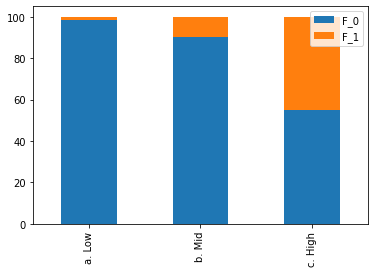

In [659]:
#MSR
#Counter Collection Data into list
Counter(census_0.msr_bin.tolist())
Counter(census_1.msr_bin.tolist())
#Storing the MSR lists into Dictionaries
msr1_dict = dict(Counter(census_1.msr_bin.tolist()))
msr0_dict = dict(Counter(census_0.msr_bin.tolist()))
#Creating MSR DataFrame
msr_df = pd.DataFrame({"0":pd.Series(msr0_dict),"1":pd.Series(msr1_dict)})
msr_df["Total"] = msr_df["0"]+msr_df["1"]
msr_df["F_0"] = msr_df["0"]/msr_df["Total"]*100
msr_df["F_1"] = msr_df["1"]/msr_df["Total"]*100
#Stacked Bar Graph
msr_percent = msr_df[["F_0", "F_1"]]
msr_percent.plot(kind = "bar",stacked = True)
plt.show()

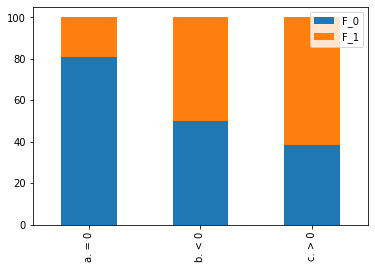

In [660]:
#Capital_Gl
#Counter Collection Data into list
Counter(census_0.capital_gl_bin.tolist())
Counter(census_1.capital_gl_bin.tolist())
#Storing the Capital_Gl lists into Dictionaries
capital_gl1_dict = dict(Counter(census_1.capital_gl_bin.tolist()))
capital_gl0_dict = dict(Counter(census_0.capital_gl_bin.tolist()))
#Creating Capital_Gl DataFrame
capital_gl_df = pd.DataFrame({"0":pd.Series(capital_gl0_dict),"1":pd.Series(capital_gl1_dict)})
capital_gl_df["Total"] = capital_gl_df["0"]+capital_gl_df["1"]
capital_gl_df["F_0"] = capital_gl_df["0"]/capital_gl_df["Total"]*100
capital_gl_df["F_1"] = capital_gl_df["1"]/capital_gl_df["Total"]*100
#Stacked Bar Graph
capital_gl_percent = capital_gl_df[["F_0", "F_1"]]
capital_gl_percent.plot(kind = "bar",stacked = True)
plt.show()

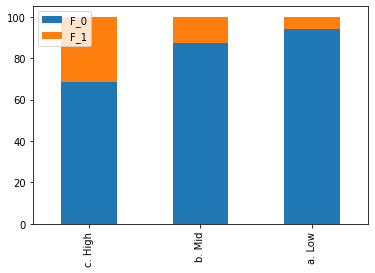

In [661]:
#Race_Sex
#Counter Collection Data into list
Counter(census_0.race_sex_bin.tolist())
Counter(census_1.race_sex_bin.tolist())
#Storing the Race_Sex lists into Dictionaries
race_sex1_dict = dict(Counter(census_1.race_sex_bin.tolist()))
race_sex0_dict = dict(Counter(census_0.race_sex_bin.tolist()))
#Creating Race_Sex DataFrame
race_sex_df = pd.DataFrame({"0":pd.Series(race_sex0_dict),"1":pd.Series(race_sex1_dict)})
race_sex_df["Total"] = race_sex_df["0"]+race_sex_df["1"]
race_sex_df["F_0"] = race_sex_df["0"]/race_sex_df["Total"]*100
race_sex_df["F_1"] = race_sex_df["1"]/race_sex_df["Total"]*100
#Stacked Bar Graph
race_sex_percent = race_sex_df[["F_0", "F_1"]]
race_sex_percent.plot(kind = "bar",stacked = True)
plt.show()

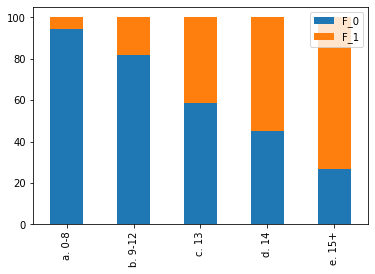

In [662]:
#Education_Num
#Counter Collection Data into list
Counter(census_0.education_num_bin.tolist())
Counter(census_1.education_num_bin.tolist())
#Storing the Education_Num lists into Dictionaries
education_num1_dict = dict(Counter(census_1.education_num_bin.tolist()))
education_num0_dict = dict(Counter(census_0.education_num_bin.tolist()))
#Creating Education_Num DataFrame
education_num_df = pd.DataFrame({"0":pd.Series(education_num0_dict),"1":pd.Series(education_num1_dict)})
education_num_df["Total"] = education_num_df["0"]+education_num_df["1"]
education_num_df["F_0"] = education_num_df["0"]/education_num_df["Total"]*100
education_num_df["F_1"] = education_num_df["1"]/education_num_df["Total"]*100
#Stacked Bar Graph
education_num_percent = education_num_df[["F_0", "F_1"]]
education_num_percent.plot(kind = "bar",stacked = True)
plt.show()

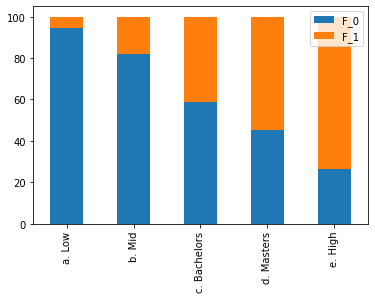

In [663]:
#Education
#Counter Collection Data into list
Counter(census_0.education_bin.tolist())
Counter(census_1.education_bin.tolist())
#Storing the Education lists into Dictionaries
education1_dict = dict(Counter(census_1.education_bin.tolist()))
education0_dict = dict(Counter(census_0.education_bin.tolist()))
#Creating Education DataFrame
education_df = pd.DataFrame({"0":pd.Series(education0_dict),"1":pd.Series(education1_dict)})
education_df["Total"] = education_df["0"]+education_df["1"]
education_df["F_0"] = education_df["0"]/education_df["Total"]*100
education_df["F_1"] = education_df["1"]/education_df["Total"]*100
#Stacked Bar Graph
education_percent = education_df[["F_0", "F_1"]]
education_percent.plot(kind = "bar",stacked = True)
plt.show()

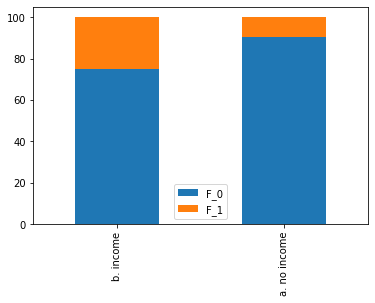

In [664]:
#Workclass
#Counter Collection Data into list
Counter(census_0.workclass_bin.tolist())
Counter(census_1.workclass_bin.tolist())
#Storing the Workclass lists into Dictionaries
workclass1_dict = dict(Counter(census_1.workclass_bin.tolist()))
workclass0_dict = dict(Counter(census_0.workclass_bin.tolist()))
#Creating Workclass DataFrame
workclass_df = pd.DataFrame({"0":pd.Series(workclass0_dict),"1":pd.Series(workclass1_dict)})
workclass_df["Total"] = workclass_df["0"]+workclass_df["1"]
workclass_df["F_0"] = workclass_df["0"]/workclass_df["Total"]*100
workclass_df["F_1"] = workclass_df["1"]/workclass_df["Total"]*100
#Stacked Bar Graph
workclass_percent = workclass_df[["F_0", "F_1"]]
workclass_percent.plot(kind = "bar",stacked = True)
plt.show()

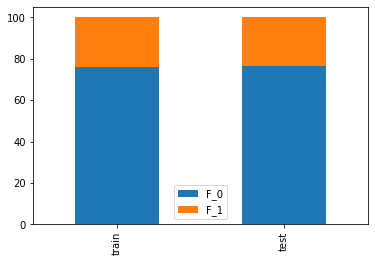

In [665]:
#Flag
#Counter Collection Data into list
Counter(census_0.flag.tolist())
Counter(census_1.flag.tolist())
#Storing the Flag lists into Dictionaries
flag1_dict = dict(Counter(census_1.flag.tolist()))
flag0_dict = dict(Counter(census_0.flag.tolist()))
#Creating Flag DataFrame
flag_df = pd.DataFrame({"0":pd.Series(flag0_dict),"1":pd.Series(flag1_dict)})
flag_df["Total"] = flag_df["0"]+flag_df["1"]
flag_df["F_0"] = flag_df["0"]/flag_df["Total"]*100
flag_df["F_1"] = flag_df["1"]/flag_df["Total"]*100
#Stacked Bar Graph
flag_percent = flag_df[["F_0", "F_1"]]
flag_percent.plot(kind = "bar",stacked = True)
plt.show()

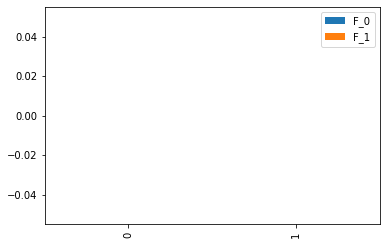

In [666]:
#Y
#Counter Collection Data into list
Counter(census_0.y.tolist())
Counter(census_1.y.tolist())
#Storing the Y lists into Dictionaries
y1_dict = dict(Counter(census_1.y.tolist()))
y0_dict = dict(Counter(census_0.y.tolist()))
#Creating Y DataFrame
y_df = pd.DataFrame({"0":pd.Series(y0_dict),"1":pd.Series(y1_dict)})
y_df["Total"] = y_df["0"]+y_df["1"]
y_df["F_0"] = y_df["0"]/y_df["Total"]*100
y_df["F_1"] = y_df["1"]/y_df["Total"]*100
#Stacked Bar Graph
y_percent = y_df[["F_0", "F_1"]]
y_percent.plot(kind = "bar",stacked = True)
plt.show()

# VII. Decision Tree Classifier Model

In [667]:
census_new = census

census_new.replace(regex={r'[a]. ': 1, r'[b]. ': 2, r'[c].': 3, r'[d]. ': 4, r'[e]. ': 5}, inplace = True)
census_new_as_test = census_new[census_new.flag == "test"]
census_new_as_train = census_new[census_new.flag == "train"]

In [668]:
#Dropping y and flag for "xtest,xtrain" and using for "ytest,ytrain"
xtest = census_new_as_test.drop(["y","flag"],axis = "columns",inplace = False)
xtrain = census_new_as_train.drop(["y","flag"],axis = "columns",inplace = False)

ytest = census_new_as_test.y
ytrain = census_new_as_train.y

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.427595 to fit



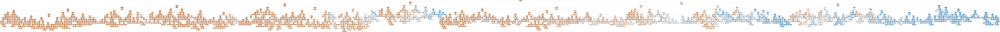

In [634]:
#Creating Decision Tree
dtree = DecisionTreeClassifier(max_depth=80, 
                                random_state=101,
                                max_features= None, 
                                min_samples_leaf= 2, 
                                min_samples_split=21,
                                criterion='gini')
dtree.fit(xtrain,ytrain)
ypredicted = dtree.predict(xtest)
 #Creating Decision Tree Using GraphViz
dot_data = StringIO()
export_graphviz(dtree, out_file=dot_data, filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

# VIII. Decision Tree Generation Using Graphviz (Also included in the previous step)

In [633]:
#Creating Decision Tree
dtree = DecisionTreeClassifier(max_depth=80, 
                                random_state=101,
                                max_features= None, 
                                min_samples_leaf= 2, 
                                min_samples_split=21,
                                criterion='gini')
dtree.fit(xtest,ytest)
ypredicted = dtree.predict(xtest)
 #Creating Decision Tree Using GraphViz
dot_data = StringIO()
export_graphviz(dtree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.713894 to fit



# IX. Tuning Decision Tree Performance

Accuracy: 0.8525889073152755
Recall: 0.5858034321372855
Precision: 0.7362745098039216
F1 Score: 0.6524761077324067
Confusion Matrix: [[11628  1593]
 [  807  2253]]


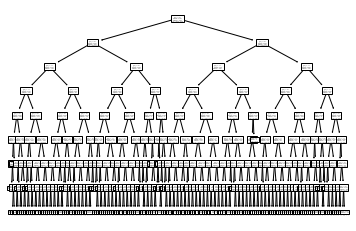

In [669]:
#Entropy I
# Creating Function to Run Model
def descision_dtree_model(criteria): # Enter 'entropy' or 'gini' to run preferred method
  dtree_model =  DecisionTreeClassifier(max_depth=8, 
                                random_state=101,
                                max_features= None, 
                                min_samples_leaf= 2, 
                                min_samples_split=2,
                                criterion=criteria)
  dtree_model.fit(xtest, ytest)
  ypredicted = dtree_model.predict(xtest)
  tree.plot_tree(dtree_model)

  # Defining evaluation metrics
  accuracy = accuracy_score(ytest, ypredicted)
  recall = recall_score(ytest, ypredicted)
  precision = precision_score(ytest, ypredicted)
  c_matrix =  confusion_matrix(ypredicted, ytest)
  f1_score = 2* ((precision*recall)/(precision + recall))
  print('Accuracy:',accuracy)
  print('Recall:', recall)
  print('Precision:', precision)
  print('F1 Score:', f1_score)
  print('Confusion Matrix:', c_matrix)
  


descision_dtree_model('entropy')


Accuracy: 0.8460782507217002
Recall: 0.5722828913156526
Precision: 0.7188112344872633
F1 Score: 0.6372321945570353
Confusion Matrix: [[11574  1645]
 [  861  2201]]


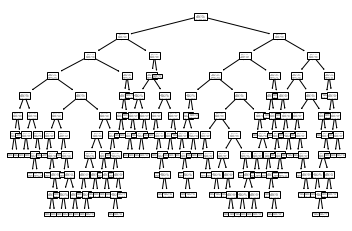

In [670]:
#Entropy II
# Creating Function to Run Model
def descision_dtree_model(criteria): # Enter 'entropy' or 'gini' to run preferred method
  dtree_model =  DecisionTreeClassifier(max_depth=10, 
                                random_state=101,
                                max_features= None, 
                                min_samples_leaf= 2, 
                                min_samples_split=250,
                                criterion=criteria)
  dtree_model.fit(xtest, ytest)
  ypredicted = dtree_model.predict(xtest)
  tree.plot_tree(dtree_model)

  # Defining evaluation metrics
  accuracy = accuracy_score(ytest, ypredicted)
  recall = recall_score(ytest, ypredicted)
  precision = precision_score(ytest, ypredicted)
  c_matrix =  confusion_matrix(ypredicted, ytest)
  f1_score = 2* ((precision*recall)/(precision + recall))
  print('Accuracy:',accuracy)
  print('Recall:', recall)
  print('Precision:', precision)
  print('F1 Score:', f1_score)
  print('Confusion Matrix:', c_matrix)
  


descision_dtree_model('entropy')

Accuracy: 0.8493335790184878
Recall: 0.5813832553302132
Precision: 0.7262098083793439
F1 Score: 0.6457761732851987
Confusion Matrix: [[11592  1610]
 [  843  2236]]


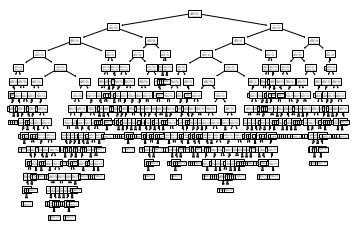

In [671]:
#Entropy III
# Creating Function to Run Model
def descision_dtree_model(criteria): # Enter 'entropy' or 'gini' to run preferred method
  dtree_model =  DecisionTreeClassifier(max_depth=17, 
                                random_state=101,
                                max_features= None, 
                                min_samples_leaf= 25, 
                                min_samples_split=20,
                                criterion=criteria)
  dtree_model.fit(xtest, ytest)
  ypredicted = dtree_model.predict(xtest)
  tree.plot_tree(dtree_model)

  # Defining evaluation metrics
  accuracy = accuracy_score(ytest, ypredicted)
  recall = recall_score(ytest, ypredicted)
  precision = precision_score(ytest, ypredicted)
  c_matrix =  confusion_matrix(ypredicted, ytest)
  f1_score = 2* ((precision*recall)/(precision + recall))
  print('Accuracy:',accuracy)
  print('Recall:', recall)
  print('Precision:', precision)
  print('F1 Score:', f1_score)
  print('Confusion Matrix:', c_matrix)
  


descision_dtree_model('entropy')

Accuracy: 0.8522818008721823
Recall: 0.5881435257410297
Precision: 0.7337009406422316
F1 Score: 0.6529080675422139
Confusion Matrix: [[11614  1584]
 [  821  2262]]


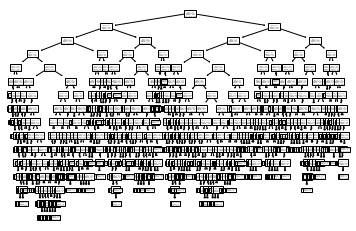

In [672]:
#Entropy IV
# Creating Function to Run Model
def descision_dtree_model(criteria): # Enter 'entropy' or 'gini' to run preferred method
  dtree_model =  DecisionTreeClassifier(max_depth=18, 
                                random_state=101,
                                max_features= None, 
                                min_samples_leaf= 12, 
                                min_samples_split=12,
                                criterion=criteria)
  dtree_model.fit(xtest, ytest)
  ypredicted = dtree_model.predict(xtest)
  tree.plot_tree(dtree_model)

  # Defining evaluation metrics
  accuracy = accuracy_score(ytest, ypredicted)
  recall = recall_score(ytest, ypredicted)
  precision = precision_score(ytest, ypredicted)
  c_matrix =  confusion_matrix(ypredicted, ytest)
  f1_score = 2* ((precision*recall)/(precision + recall))
  print('Accuracy:',accuracy)
  print('Recall:', recall)
  print('Precision:', precision)
  print('F1 Score:', f1_score)
  print('Confusion Matrix:', c_matrix)
  


descision_dtree_model('entropy')

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.96 µs
Accuracy: 0.8567655549413427
Recall: 0.5912636505460218
Precision: 0.7495056031641397
F1 Score: 0.661046511627907
Confusion Matrix: [[11675  1572]
 [  760  2274]]


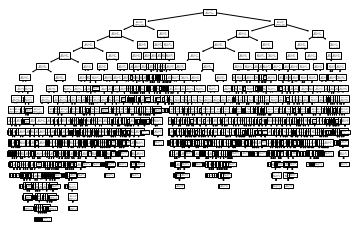

In [673]:
#Gini I
# Creating Function to Run Model
%time
def descision_dtree_model(criteria): # Enter 'entropy' or 'gini' to run preferred method
  dtree_model =  DecisionTreeClassifier(max_depth=80, 
                                random_state=101,
                                max_features= None, 
                                min_samples_leaf= 2, 
                                min_samples_split=21,
                                criterion=criteria)
  dtree_model.fit(xtest, ytest)
  ypredicted = dtree_model.predict(xtest)
  tree.plot_tree(dtree_model)

  # Defining evaluation metrics
  accuracy = accuracy_score(ytest, ypredicted)
  recall = recall_score(ytest, ypredicted)
  precision = precision_score(ytest, ypredicted)
  c_matrix =  confusion_matrix(ypredicted, ytest)
  f1_score = 2* ((precision*recall)/(precision + recall))
  print('Accuracy:',accuracy)
  print('Recall:', recall)
  print('Precision:', precision)
  print('F1 Score:', f1_score)
  print('Confusion Matrix:', c_matrix)
  


descision_dtree_model('gini')

Accuracy: 0.8498249493274369
Recall: 0.5847633905356214
Precision: 0.7261866322247336
F1 Score: 0.6478467521244419
Confusion Matrix: [[11587  1597]
 [  848  2249]]


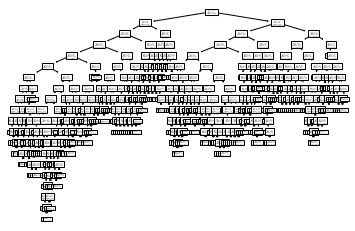

In [674]:
#Gini II
# Creating Function to Run Model
def descision_dtree_model(criteria): # Enter 'entropy' or 'gini' to run preferred method
  dtree_model =  DecisionTreeClassifier(max_depth=81, 
                                random_state=101,
                                max_features= None, 
                                min_samples_leaf= 23, 
                                min_samples_split=22,
                                criterion=criteria)
  dtree_model.fit(xtest, ytest)
  ypredicted = dtree_model.predict(xtest)
  tree.plot_tree(dtree_model)

  # Defining evaluation metrics
  accuracy = accuracy_score(ytest, ypredicted)
  recall = recall_score(ytest, ypredicted)
  precision = precision_score(ytest, ypredicted)
  c_matrix =  confusion_matrix(ypredicted, ytest)
  f1_score = 2* ((precision*recall)/(precision + recall))
  print('Accuracy:',accuracy)
  print('Recall:', recall)
  print('Precision:', precision)
  print('F1 Score:', f1_score)
  print('Confusion Matrix:', c_matrix)
  


descision_dtree_model('gini')

Accuracy: 0.8554757078803513
Recall: 0.5891835673426937
Precision: 0.7456400131622244
F1 Score: 0.6582425562817721
Confusion Matrix: [[11662  1580]
 [  773  2266]]


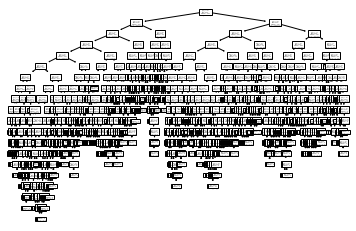

In [675]:
#Gini III
# Creating Function to Run Model
def descision_dtree_model(criteria): # Enter 'entropy' or 'gini' to run preferred method
  dtree_model =  DecisionTreeClassifier(max_depth=77, 
                                random_state=101,
                                max_features= None, 
                                min_samples_leaf= 7, 
                                min_samples_split=9,
                                criterion=criteria)
  dtree_model.fit(xtest, ytest)
  ypredicted = dtree_model.predict(xtest)
  tree.plot_tree(dtree_model)

  # Defining evaluation metrics
  accuracy = accuracy_score(ytest, ypredicted)
  recall = recall_score(ytest, ypredicted)
  precision = precision_score(ytest, ypredicted)
  c_matrix =  confusion_matrix(ypredicted, ytest)
  f1_score = 2* ((precision*recall)/(precision + recall))
  print('Accuracy:',accuracy)
  print('Recall:', recall)
  print('Precision:', precision)
  print('F1 Score:', f1_score)
  print('Confusion Matrix:', c_matrix)
  


descision_dtree_model('gini')

Accuracy: 0.8451569313924207
Recall: 0.5434217368694748
Precision: 0.7320490367775832
F1 Score: 0.6237874944038203
Confusion Matrix: [[11670  1756]
 [  765  2090]]


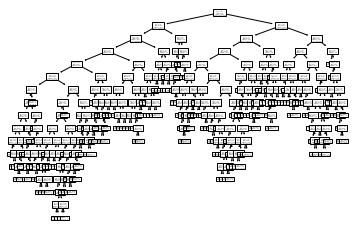

In [676]:
#Gini IV
# Creating Function to Run Model
def descision_dtree_model(criteria): # Enter 'entropy' or 'gini' to run preferred method
  dtree_model =  DecisionTreeClassifier(max_depth=48, 
                                random_state=101,
                                max_features= None, 
                                min_samples_leaf= 43, 
                                min_samples_split=3,
                                criterion=criteria)
  dtree_model.fit(xtest, ytest)
  ypredicted = dtree_model.predict(xtest)
  tree.plot_tree(dtree_model)

  # Defining evaluation metrics
  accuracy = accuracy_score(ytest, ypredicted)
  recall = recall_score(ytest, ypredicted)
  precision = precision_score(ytest, ypredicted)
  c_matrix =  confusion_matrix(ypredicted, ytest)
  f1_score = 2* ((precision*recall)/(precision + recall))
  print('Accuracy:',accuracy)
  print('Recall:', recall)
  print('Precision:', precision)
  print('F1 Score:', f1_score)
  print('Confusion Matrix:', c_matrix)
  


descision_dtree_model('gini')

# X. Automation

In [677]:
#auto_testing = pd.read_excel("/content/Auto Testing (Dhiman Sarkar).xlsx")

In [678]:
#for a in auto:
 # a = df.loc[df.d == i, :]
#dtree_model =  DecisionTreeClassifier(max_depth=48, 
                               # random_state=101,
                               # max_features= None, 
                               # min_samples_leaf= 43, 
                               # min_samples_split=3,
                               # criterion=criteria)
 # dtree_model.fit(xtest, ytest)
 # ypredicted = dtree_model.predict(xtest)
 # tree.plot_tree(dtree_model)

  # Defining evaluation metrics
  #accuracy = accuracy_score(ytest, ypredicted)
  #recall = recall_score(ytest, ypredicted)
  #precision = precision_score(ytest, ypredicted)
  #c_matrix =  confusion_matrix(ypredicted, ytest)
  #f1_score = 2* ((precision*recall)/(precision + recall))

IndentationError: ignored

# XI. Predicting Using "Trained" Decision Tree Model

In [ ]:
def forecast(race_sex,age,msr, hours_per_week,occupation, capital_gl,workclass, eduction_num, eduction):
 
  df1 = pd.DataFrame()
  df1['race_sex_bin'] = [race_sex]
  df1['age_bin'] = [age]
  df1['msr_bin'] = [msr]
  df1['hours_per_week_bin'] = [hours_per_week]
  df1['occupation_bin']  = [occupation]
  df1['capital_gl_bin'] = [capital_gl]
  df1['education_num_bin'] = [eduction_num]
  df1['education_bin'] = [eduction]
  df1['workclass_bin'] = [workclass]
  
  return dtree.predict(df1)

forecast(4,2,3,3,2,2,5,4,4)